In [1]:
# Load the libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as pl
from matplotlib import rcParams
import scanpy as sc
import scvelo as scv
import cellrank as cr
from matplotlib import colors # for better color set
import os

scv.set_figure_params()
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization

import warnings
warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)
warnings.simplefilter("ignore", category=DeprecationWarning)

In [2]:
scv.set_figure_params() 

In [3]:
scv.logging.print_version()

Running scvelo 0.2.5 (python 3.9.16) on 2023-05-08 10:57.


ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI no longer supports 'pip search' (or XML-RPC search). Please use https://pypi.org/search (via a browser) instead. See https://warehouse.pypa.io/api-reference/xml-rpc.html#deprecated-methods for more information.


In [4]:
# Here are the tool version I am using. I noticed that anndata, and rpy2 may not work well depending on the version.
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=200, fontsize=11, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.21.5 scipy==1.10.0 pandas==1.5.2 scikit-learn==1.2.1 statsmodels==0.13.5 python-igraph==0.10.3 louvain==0.8.0 pynndescent==0.5.8


In [5]:
# Package to convert Seurat > SingleCellExperiment > AnnData
# done separated using R seuratdisk package

In [6]:
#adata = sc.read_h5ad("data/ari_org/ari_org_aggr_raw.h5ad")
#adata = sc.read_h5ad("data/ari_org/ari_org.integrated.h5ad")
adata = sc.read_h5ad("data/ari_org/ari_org.annotated.h5ad")

In [7]:
adata

AnnData object with n_obs × n_vars = 17537 × 29404
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent_mt', 'percent_rb', 'nUMI', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'nCount_SCT', 'nFeature_SCT', 'CC.Difference', 'integrated_snn_res.0.3', 'integrated_snn_res.0.5', 'integrated_snn_res.0.6', 'integrated_snn_res.0.7', 'integrated_snn_res.0.8', 'integrated_snn_res.0.9', 'integrated_snn_res.1', 'seurat_clusters', 'clusters', 'sample', 'project', 'celltype', 'cell_id'
    var: 'features'
    obsm: 'X_tsne', 'X_umap'

In [8]:
adata.obs.sample

<bound method NDFrame.sample of                           orig.ident  nCount_RNA  nFeature_RNA  percent_mt  \
AAACCCAAGAACCCGA-1_1  Arima_Pre1_con      8096.0          3786    0.049407   
AAACCCAAGACATCAA-1_1  Arima_Pre1_con      6645.0          3199    0.015049   
AAACCCAAGCGACCCT-1_1  Arima_Pre1_con      8680.0          4231    0.000000   
AAACCCACAACGCCCA-1_1  Arima_Pre1_con      3434.0          2203    0.029121   
AAACCCACATACCAGT-1_1  Arima_Pre1_con      7236.0          3560    0.000000   
...                              ...         ...           ...         ...   
TTTGTTGCACCCAACG-1_3  Arima_EMO6_hor      8944.0          4110    0.033542   
TTTGTTGCAGCGGTTC-1_3  Arima_EMO6_hor      8043.0          4018    0.049733   
TTTGTTGGTACACGTT-1_3  Arima_EMO6_hor      7345.0          3677    0.040844   
TTTGTTGGTTCAACGT-1_3  Arima_EMO6_hor     12139.0          4465    0.024714   
TTTGTTGGTTCTCGCT-1_3  Arima_EMO6_hor      4481.0          2832    0.044633   

                      percent_r

In [9]:
# This step convert to float64 so it will be more consistent among platforms
# this is not required and results will be comparable without it
adata.X = adata.X.astype('float64') 

In [10]:
adata.obs_names_make_unique()
adata.var_names_make_unique()

In [11]:
adata.obs.celltype.unique()

array(['Ciliated', 'Stromal', 'LGR5+', 'Luminal', 'NH', 'Glandular',
       'Surface', 'PV-like', 'Proliferative', 'Endo', '13', '10'],
      dtype=object)

In [12]:
# Import the loom file information and merge
ldata = scv.read("data/ari_org/ari.merged.loom", cache=True)
ldata

... reading from cache file cache/data-ari_org-ari.merged.h5ad


AnnData object with n_obs × n_vars = 19395 × 36601
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [13]:
ldata.obs_names_make_unique()
ldata.var_names_make_unique()

In [14]:
common_obs = pd.unique(adata.obs_names.intersection(ldata.obs_names)) 
common_obs

array([], dtype=object)

In [15]:
# check if data have similar names
print(adata.obs_names, ldata.obs_names)

scv.utils.clean_obs_names(adata)
scv.utils.clean_obs_names(ldata)
print(adata.obs_names, ldata.obs_names)

Index(['AAACCCAAGAACCCGA-1_1', 'AAACCCAAGACATCAA-1_1', 'AAACCCAAGCGACCCT-1_1',
       'AAACCCACAACGCCCA-1_1', 'AAACCCACATACCAGT-1_1', 'AAACCCACATGGTACT-1_1',
       'AAACCCAGTCTAATCG-1_1', 'AAACCCATCCGATAAC-1_1', 'AAACCCATCTTACGGA-1_1',
       'AAACGAAAGTTGCCCG-1_1',
       ...
       'TTTGGTTGTGTCTAAC-1_3', 'TTTGGTTTCATTGAGC-1_3', 'TTTGGTTTCCACGAAT-1_3',
       'TTTGTTGAGACCATAA-1_3', 'TTTGTTGCAAGCCCAC-1_3', 'TTTGTTGCACCCAACG-1_3',
       'TTTGTTGCAGCGGTTC-1_3', 'TTTGTTGGTACACGTT-1_3', 'TTTGTTGGTTCAACGT-1_3',
       'TTTGTTGGTTCTCGCT-1_3'],
      dtype='object', length=17537) Index(['EMO6_hor:AAACCCAGTAGTTCCAx', 'EMO6_hor:AACAACCAGGGCTGATx',
       'EMO6_hor:AAAGGATTCGTGGGAAx', 'EMO6_hor:AAATGGATCGGAATTCx',
       'EMO6_hor:AAAGGGCAGAAGCTGCx', 'EMO6_hor:AACAAAGTCCATGCAAx',
       'EMO6_hor:AAAGTCCCATCAGCTAx', 'EMO6_hor:AAATGGATCAGATGCTx',
       'EMO6_hor:AAAGGTAGTCTTACAGx', 'EMO6_hor:AAACCCAAGTCACTCAx',
       ...
       'Pre1_hor:TTTCAGTTCTACTCATx', 'Pre1_hor:TTTCAGTCACCTGCAGx',
   

In [16]:
# clean the names
scv.utils.clean_obs_names(adata)
scv.utils.clean_obs_names(ldata)
print(adata.obs_names.intersection(ldata.obs_names))

Index(['AAACCCAAGAAC', 'AAACCCAAGACA', 'AAACCCAAGCGA', 'AAACCCACAACG',
       'AAACCCACATAC', 'AAACCCACATGG', 'AAACCCAGTCTA', 'AAACCCATCCGA',
       'AAACCCATCTTA', 'AAACGAAAGTTG',
       ...
       'TTTGGTTGTGTC', 'TTTGGTTTCATT', 'TTTGGTTTCCAC', 'TTTGTTGAGACC',
       'TTTGTTGCAAGC', 'TTTGTTGCACCC', 'TTTGTTGCAGCG', 'TTTGTTGGTACA',
       'TTTGTTGGTTCA', 'TTTGTTGGTTCT'],
      dtype='object', length=17537)


In [17]:
# Merge the RNA velocities into the preprecessed object imported from Seurat
adata = scv.utils.merge(adata, ldata)

In [18]:
adata.var_names

Index(['AL627309.1', 'AL627309.5', 'AL627309.4', 'AP006222.2', 'AC114498.1',
       'AL669831.2', 'LINC01409', 'FAM87B', 'LINC01128', 'LINC00115',
       ...
       'XPNPEP2', 'LINC01201', 'AL135784.1', 'FRMD7', 'AL500522.1', 'AFF2-IT1',
       'HSFX3', 'BX546450.2', 'HCFC1-AS1', 'AC245140.1'],
      dtype='object', length=29395)

In [19]:
adata.obs.celltype

AAACCCAAGAAC         Ciliated
AAACCCAAGACA          Stromal
AAACCCAAGCGA          Stromal
AAACCCACAACG            LGR5+
AAACCCACATAC          Luminal
                    ...      
TTTGTTGCACCC    Proliferative
TTTGTTGCAGCG    Proliferative
TTTGTTGGTACA            LGR5+
TTTGTTGGTTCA               NH
TTTGTTGGTTCT          Surface
Name: celltype, Length: 17537, dtype: object

In [20]:
adata

AnnData object with n_obs × n_vars = 17537 × 29395
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent_mt', 'percent_rb', 'nUMI', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'nCount_SCT', 'nFeature_SCT', 'CC.Difference', 'integrated_snn_res.0.3', 'integrated_snn_res.0.5', 'integrated_snn_res.0.6', 'integrated_snn_res.0.7', 'integrated_snn_res.0.8', 'integrated_snn_res.0.9', 'integrated_snn_res.1', 'seurat_clusters', 'clusters', 'sample', 'project', 'celltype', 'cell_id', 'sample_batch', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size'
    var: 'features', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    obsm: 'X_tsne', 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [21]:
# The preprocessing involves: 
# filtering cells that have minimum of 20 shared counts
# normalize per cell
# filter genes dispersion (top 2000 genes)
# log1p
scv.pp.filter_and_normalize(adata)
scv.pp.moments(adata)# , n_pcs=20, n_neighbors=20)

Normalized count data: X, spliced, unspliced.
computing PCA
    with n_comps=30
    finished (0:00:17)
computing neighbors
    finished (0:00:14) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:16) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


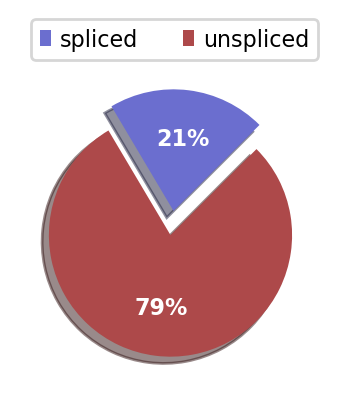

In [22]:
# Proportion of unspliced and spliced reads identified in each cluster
scv.pl.proportions(adata, groupby='stage')

In [23]:
# Dynamical modeling to solve the full transcrional dynamics
# https://www.nature.com/articles/s41587-020-0591-3
scv.tl.recover_dynamics(adata, n_jobs=8) # necessary for the dynamical mode
scv.tl.velocity(adata, mode='dynamical') #deterministic, stochastic, steady_state

recovering dynamics (using 8/256 cores)


  0%|          | 0/2518 [00:00<?, ?gene/s]

    finished (0:07:57) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:26) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [24]:
scv.tl.velocity_graph(adata)

computing velocity graph (using 1/256 cores)


  0%|          | 0/17537 [00:00<?, ?cells/s]

    finished (0:00:54) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [25]:
adata.obs.celltype

AAACCCAAGAAC         Ciliated
AAACCCAAGACA          Stromal
AAACCCAAGCGA          Stromal
AAACCCACAACG            LGR5+
AAACCCACATAC          Luminal
                    ...      
TTTGTTGCACCC    Proliferative
TTTGTTGCAGCG    Proliferative
TTTGTTGGTACA            LGR5+
TTTGTTGGTTCA               NH
TTTGTTGGTTCT          Surface
Name: celltype, Length: 17537, dtype: category
Categories (12, object): ['10', '13', 'Ciliated', 'Endo', ..., 'PV-like', 'Proliferative', 'Stromal', 'Surface']

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    543 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    545 total control genes are used. (0:00:00)
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


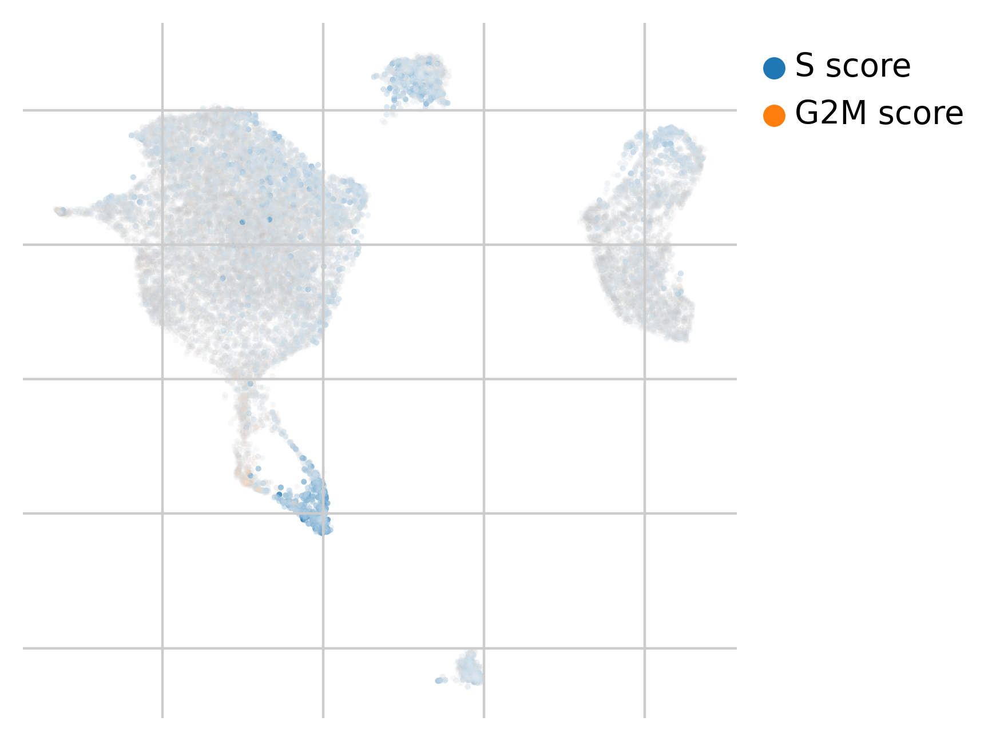

In [26]:
# This function calculates the cell cycle phase scores using a list of known 
# cycling genes defined in https://www.science.org/doi/10.1126/science.aad0501
scv.tl.score_genes_cell_cycle(adata, use_raw = False)
scv.pl.scatter(adata, color_gradients=['S_score', 'G2M_score'], 
               smooth=True, perc=[5, 95])

In [52]:
final_color_palette={"Ciliated": "#A6CEE3",
                     "Stromal": "#E7298A",
                     "LGR5+":"#D95F02",
                     "Luminal": "#A6761D",
                     "NH": "#1B9E77",
                     "Glandular": "#66A61E",
                     "Surface": "#7570B3",
                     "PV-like": "#E6AB02",
                     "Proliferative": "#666666",
                     "Endo": "#B2DF8A",
                     "13": "#33A02C",
                     "10": "#1F78B4"}

saving figure to file ./figures/scvelo_UMAP_stream.pdf


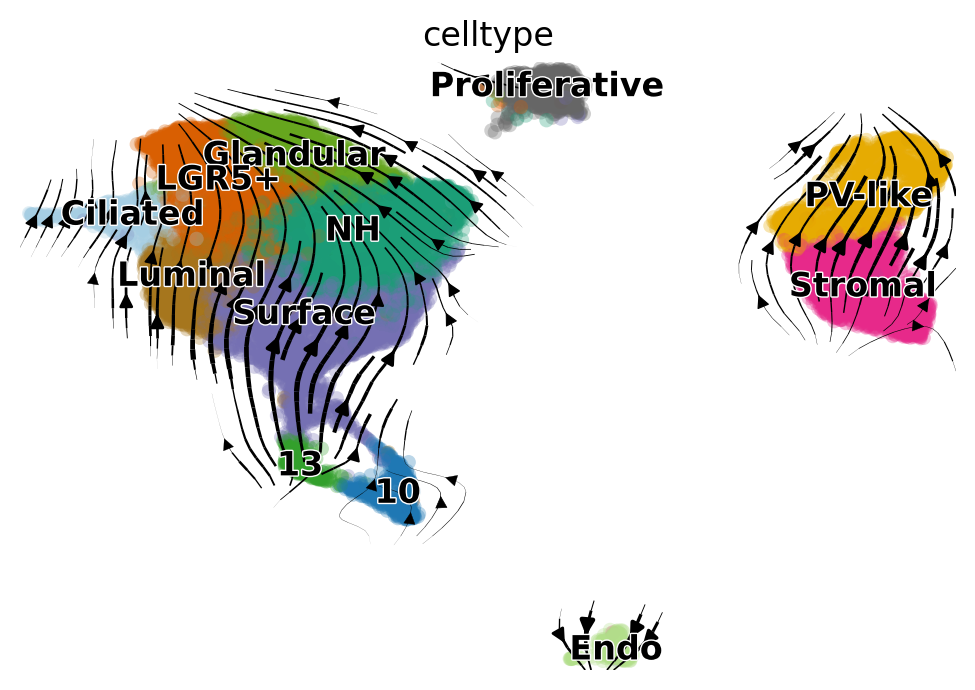

In [65]:
# scVelo stream style arrows embedding
# We can observe the infered trajectory from cells based on the directions
scv.pl.velocity_embedding_stream(adata, basis = 'umap', color='celltype', palette=final_color_palette,
                                 smooth=0.8, frameon = False, save = 'UMAP_stream.pdf')

KeyError: 'Arima_EMO6_hor'

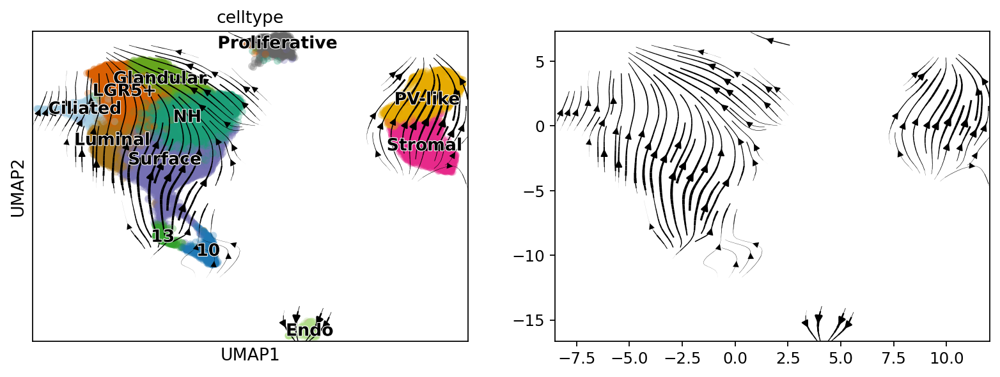

In [67]:
# We can also observe the differences by samples
scv.pl.velocity_embedding_stream(adata, basis = 'umap', color=['celltype', 'sample'], palette=final_color_palette,
                                 smooth=0.8, frameon = True, save = 'UMAP_stream.pdf')

saving figure to file ./figures/scvelo_UMAP_grid.pdf


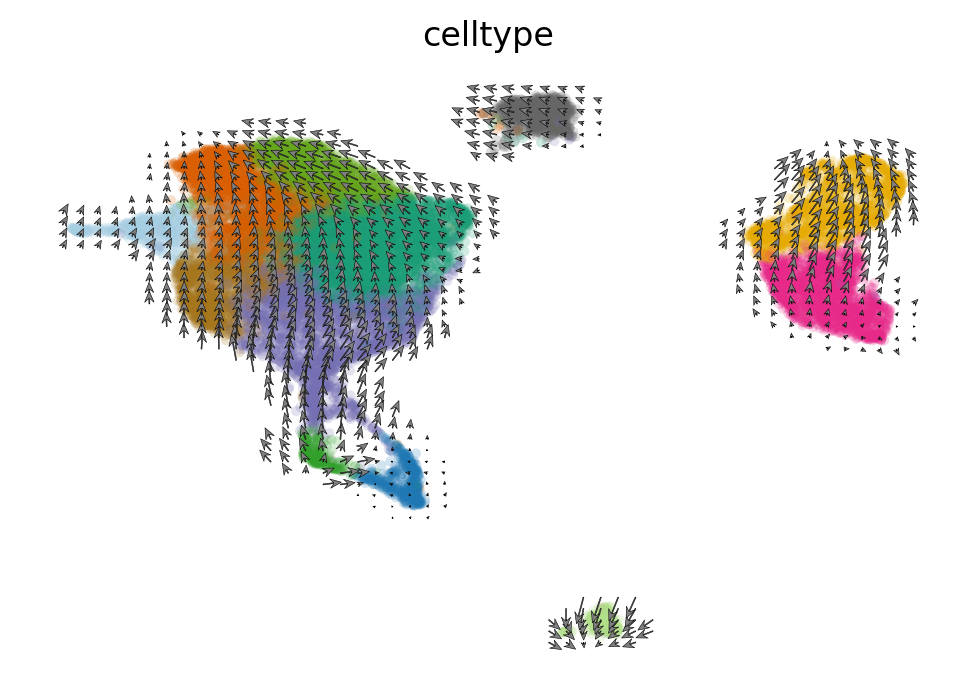

In [68]:
# We can also observe the cell dynamics with these discrete arrows. The arrows here does
# not represent cells but an overall generalization based on the cells around.
scv.pl.velocity_embedding_grid(adata, basis = 'umap', color='celltype', smooth=0.8, palette=final_color_palette,
                               frameon = False, save = 'UMAP_grid.pdf', arrow_size=2, arrow_length=2)

saving figure to file ./figures/scvelo_UMAP_stream_sample.pdf


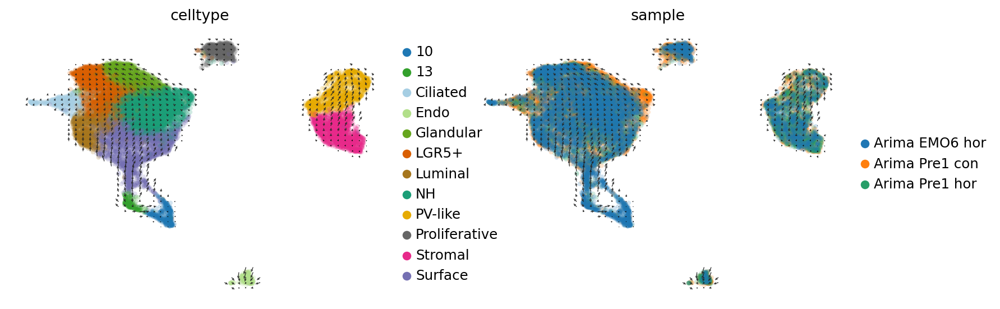

In [69]:
scv.pl.velocity_embedding_grid(adata, basis = 'umap', color = ['celltype', 'sample'], 
                                 frameon = False, save = 'UMAP_stream_sample.pdf', legend_loc = 'right margin')

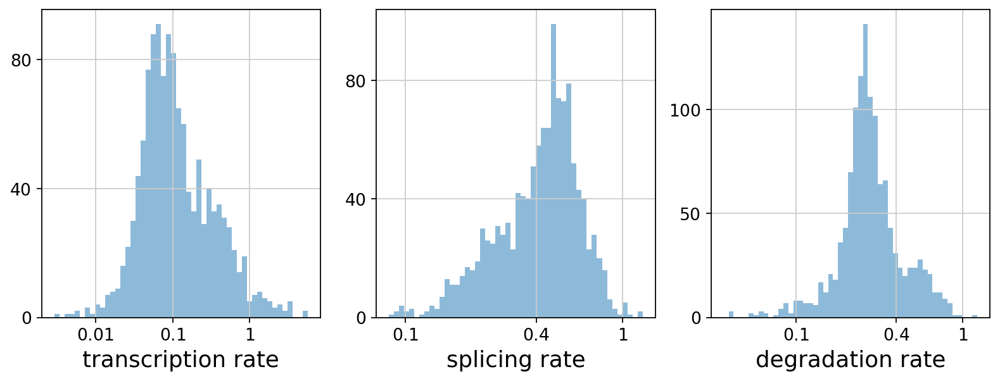

,fit_r2,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling
HES4,0.078278,0.374383,6.193342,0.472257,3.880228,0.052829,0.015124,0.133117,0.040584,0.0,0.0,0.395807,0.053683,0.389606,1.769336,1.406216
TNFRSF4,0.213999,0.072475,1.037853,0.256215,4.163382,0.654805,0.020794,0.042112,0.001279,0.0,0.0,0.099304,0.064117,0.116923,0.839244,1.704273
CCNL2,0.127652,0.271928,0.953368,0.250575,11.953344,0.223475,0.090981,0.192364,0.248223,0.0,0.0,0.195786,0.276365,0.684731,0.893641,2.164946
MEGF6,0.473814,0.112900,0.580725,0.342127,7.620641,0.875192,0.062711,0.087776,0.091121,0.0,0.0,0.462805,0.238917,0.389793,2.850721,2.295477
ENO1,0.519497,0.580192,0.407768,0.591026,10.585548,0.677313,0.304774,0.212613,0.180768,0.0,0.0,0.487291,1.477148,0.698167,1.495025,1.629332


In [31]:
# We can also estimate the rates of RNA transcription, splicing and degradation.

df = adata.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata, 'fit*', dropna=True).head()

In [32]:
scv.tl.rank_velocity_genes(adata, groupby='celltype', min_corr=.3)

df = scv.DataFrame(adata.uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes


/opt/conda/envs/CellRank/lib/python3.9/site-packages/scvelo/tools/utils.py:501: DeprecationWarning: Please use `rankdata` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import rankdata


    finished (0:01:15) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


/tmp/ipykernel_197890/619222111.py:3: DeprecationWarning: `scvelo.read_load.get_df` is deprecated since scVelo v0.2.4 and will be removed in a future version. Please use `scvelo.core.get_df` instead.
  df = scv.DataFrame(adata.uns['rank_velocity_genes']['names'])


,10,13,Ciliated,Endo,Glandular,LGR5+,Luminal,NH,PV-like,Proliferative,Stromal,Surface
0,PDK1,SLC38A2,IGF2BP3,STARD9,LIMCH1,LIMCH1,PPP1R9A,HOMER2,PIEZO2,TMPRSS4,VSTM4,PPP1R9A
1,VEGFA,VEGFA,FMN1,MAN1A1,SLC37A1,LINC01320,EHF,MECOM,AK5,PAX8,NID2,SYNE2
2,SLC38A2,FEM1C,FGFR2,TOX2,LINC01320,SLC37A1,KIAA1217,NOSTRIN,HOXD10,CLMN,HOXD10,ARHGAP8
3,PGK1,EEF2,NFIB,ADAM23,CDH1,SLC38A1,MFHAS1,FGFR2,NID2,FMN1,INHBA,NPEPPS
4,FEM1C,PDK1,SLC16A10,DDR2,PAX8,CDH1,CA8,SLC34A2,PDGFRA,SLC37A1,LAMC3,EHF


In [75]:
# Reference: 

markers = ["EPCAM", "SOX9", "MMP7",             #SOX9
            "LGR5",                    #Lumenal "PTGS1",  
             "PAEP",        #Glandular  "SCGB2A2","SLC18A2",
                                 #Ciliated "FOXJ1", "PIFO",
            "ACTA2",    #uSMC "MYH11", "LEFTY2","ACTG2",
                         #PV MYH11 "RGS5", "NTRK2",  "FHL5", 
            "GUCY1A2",  "PCOLCE", #PV STEAP4 "STEAP4", "IGF1",
                                      #Fibroblast C7 "C7", "OGN",
            "MMP11",                     #eS "SFRP1",
                          #dS "DKK1",  "FOXO1",       
            "CD34", "SEMA3G",             #Endothelial artery "GJA5",
            "PLVAP",                    #Endothelial vein ACKR1
                          #Lymphoid "PTPRC",  "CD3G","NCAM1",
            "CD14", "CSF1R"]                     #Myeloid

/opt/conda/envs/CellRank/lib/python3.9/site-packages/scvelo/plotting/utils.py:866: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = pl.colorbar(smp, orientation=orientation, cax=cax)
/opt/conda/envs/CellRank/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
/opt/conda/envs/CellRank/lib/python3.9/site-packages/scvelo/plotting/utils.py:866: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = pl.colorbar(smp, orientation=orientation, cax=cax)
/opt/conda/envs/CellRank/lib/python3.9/site-packages/scvelo/plotting/utils.py:869:

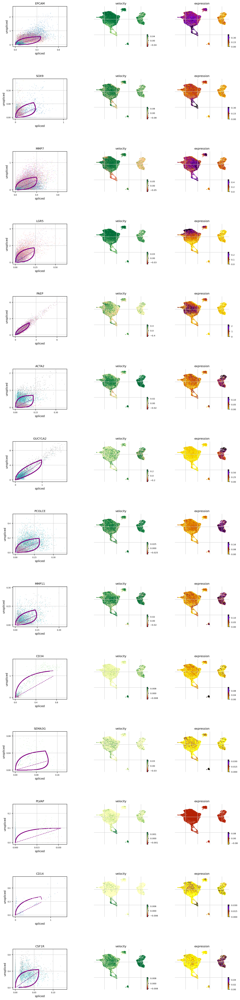

In [34]:
# Or a group of genes
scv.pl.velocity(adata, var_names=markers, color='celltype')

/opt/conda/envs/CellRank/lib/python3.9/site-packages/scvelo/plotting/utils.py:866: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = pl.colorbar(smp, orientation=orientation, cax=cax)
/opt/conda/envs/CellRank/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
/opt/conda/envs/CellRank/lib/python3.9/site-packages/scvelo/plotting/utils.py:866: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = pl.colorbar(smp, orientation=orientation, cax=cax)
/opt/conda/envs/CellRank/lib/python3.9/site-packages/scvelo/plotting/utils.py:869:

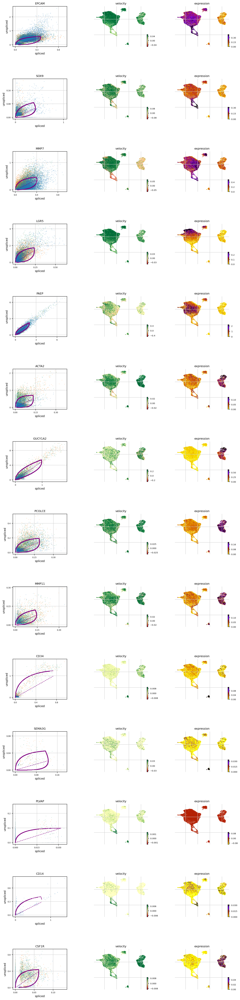

In [35]:
# Or a group of genes
scv.pl.velocity(adata, var_names=markers, color='sample')

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


/opt/conda/envs/CellRank/lib/python3.9/site-packages/scvelo/plotting/utils.py:866: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = pl.colorbar(smp, orientation=orientation, cax=cax)
/opt/conda/envs/CellRank/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


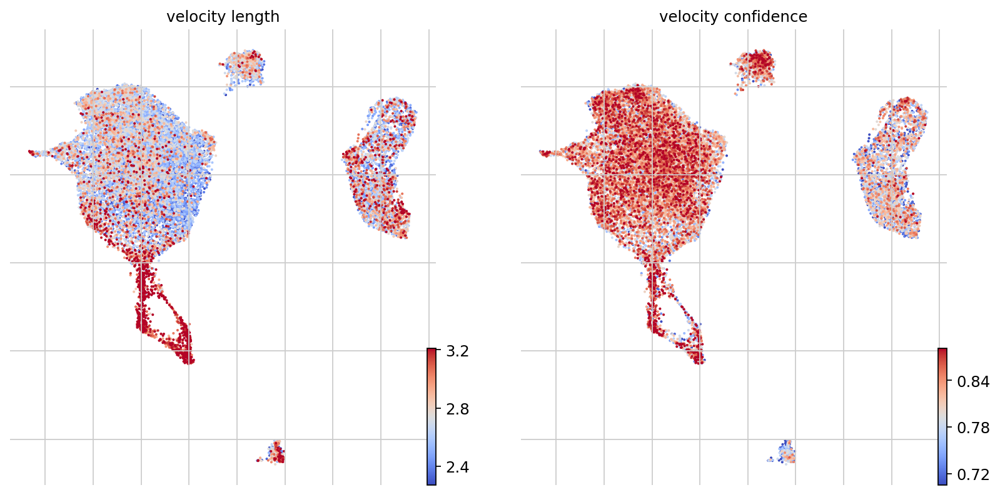

In [36]:
scv.tl.velocity_confidence(adata)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95], )

In [37]:
df = adata.obs.groupby('celltype')[keys].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

celltype,10,13,Ciliated,Endo,Glandular,LGR5+,Luminal,NH,PV-like,Proliferative,Stromal,Surface
velocity_length,3.145305,3.212536,2.612727,2.644167,2.555925,2.618501,2.633003,2.537456,2.656460,2.618211,2.679059,2.680295
velocity_confidence,0.802085,0.839271,0.803801,0.727933,0.803371,0.805568,0.815555,0.811628,0.771373,0.805995,0.766329,0.807693


In [38]:
#df = adata.obs.groupby('orig.ident')[keys].mean().T
#df.style.background_gradient(cmap='coolwarm', axis=1)

In [39]:
# Identify terminal states 
cr.tl.terminal_states(adata, cluster_key="celltype", weight_connectivities=0.2)

/tmp/ipykernel_197890/632151141.py:2: DeprecationWarning: `cellrank.tl.terminal_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.terminal_states(adata, cluster_key="celltype", weight_connectivities=0.2)
/opt/conda/envs/CellRank/lib/python3.9/site-packages/cellrank/tl/_init_term_states.py:156: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  kernel = transition_matrix(


  0%|          | 0/17537 [00:00<?, ?cell/s]

  0%|          | 0/17537 [00:00<?, ?cell/s]

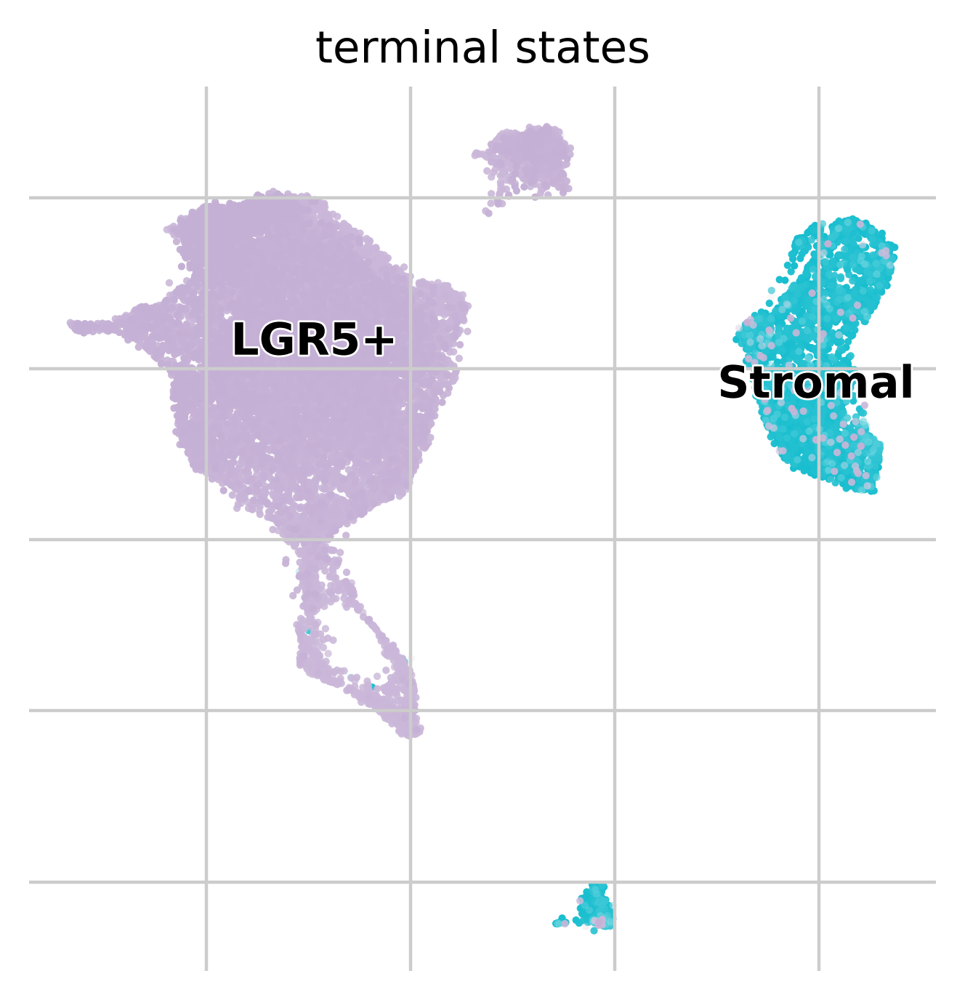

In [40]:
cr.pl.terminal_states(adata)

/tmp/ipykernel_197890/3849737554.py:2: DeprecationWarning: `cellrank.tl.initial_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.initial_states(adata, cluster_key="celltype")
/opt/conda/envs/CellRank/lib/python3.9/site-packages/cellrank/tl/_init_term_states.py:156: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  kernel = transition_matrix(


  0%|          | 0/17537 [00:00<?, ?cell/s]

[0]PETSC ERROR: [0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 11 SEGV: Segmentation Violation, probably memory access out of range
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
[0]PETSC ERROR: Run with -malloc_debug to check if memory corruption is causing the crash.
--------------------------------------------------------------------------
MPI_ABORT was invoked on rank 0 in communicator MPI_COMM_WORLD
with errorcode 59.

NOTE: invoking MPI_ABORT causes Open MPI to kill all MPI processes.
You may or may not see output from other processes, depending on
exactly when Open MPI kills them.
------------------------------------------------------------------

  0%|          | 0/17537 [00:00<?, ?cell/s]

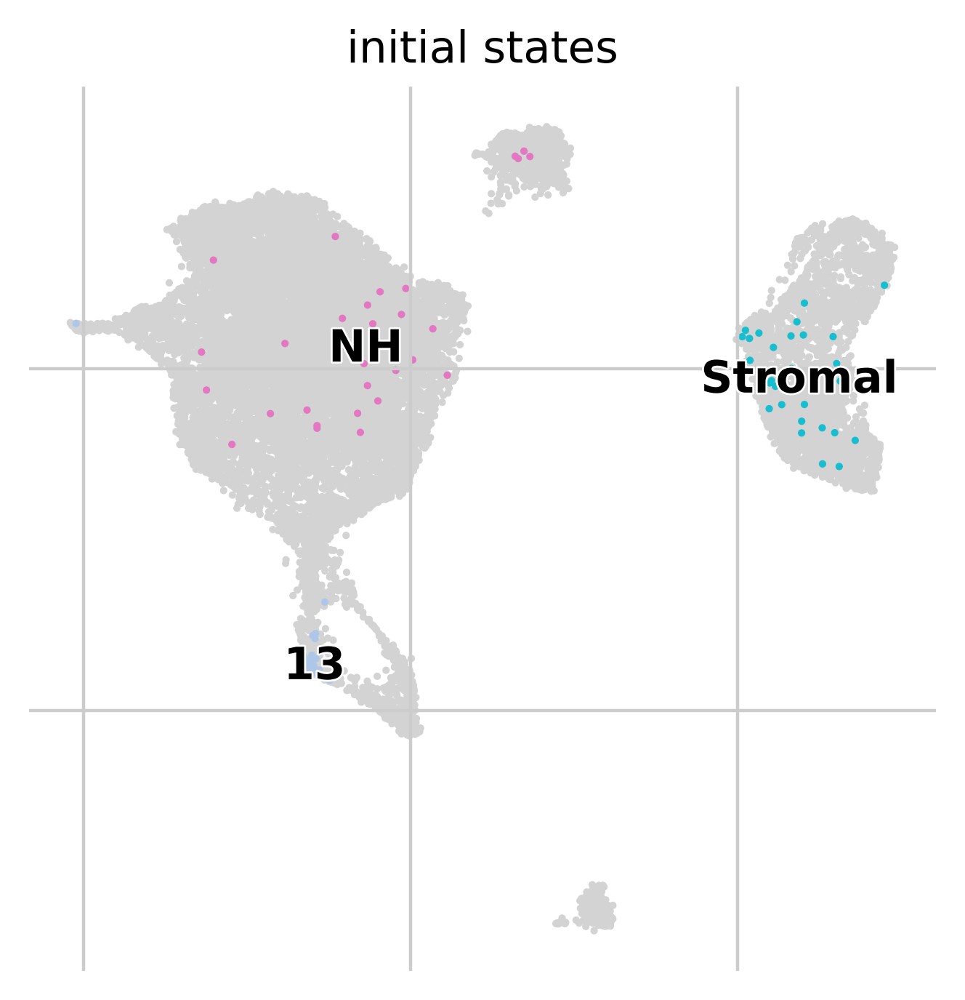

In [41]:
# Identifical initial states
cr.tl.initial_states(adata, cluster_key="celltype")
cr.pl.initial_states(adata, discrete=True)

/tmp/ipykernel_197890/2023708795.py:2: DeprecationWarning: `cellrank.tl.lineages` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineages(adata)


  0%|          | 0/2 [00:00<?, ?/s]

/opt/conda/envs/CellRank/lib/python3.9/site-packages/scvelo/plotting/utils.py:866: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = pl.colorbar(smp, orientation=orientation, cax=cax)
/opt/conda/envs/CellRank/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


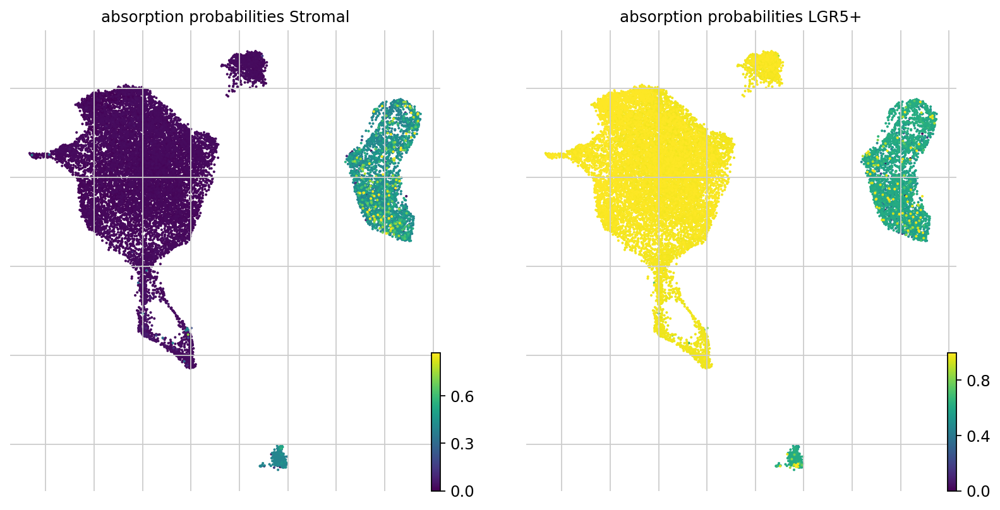

In [42]:
# Compute fate maps
cr.tl.lineages(adata)
cr.pl.lineages(adata, same_plot=False)

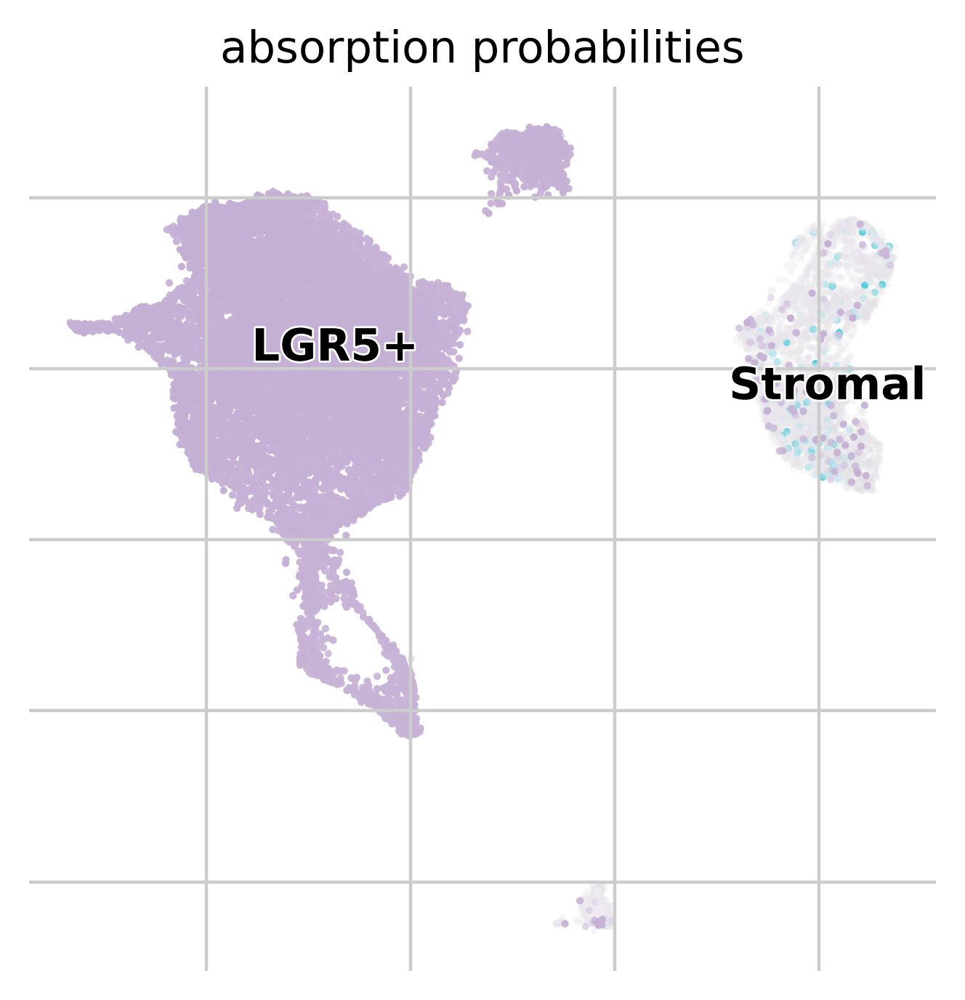

In [43]:
cr.pl.lineages(adata, same_plot=True)

In [44]:
# Directed PAGA graph
scv.tl.recover_latent_time(
    adata, root_key="initial_states_probs", end_key="terminal_states_probs"
)

computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:15) --> added 
    'latent_time', shared time (adata.obs)


In [45]:
scv.tl.paga(
    adata,
    groups="celltype",
    root_key="initial_states_probs",
    end_key="terminal_states_probs",
    use_time_prior="velocity_pseudotime",
)

running PAGA using priors: ['velocity_pseudotime', 'initial_states_probs', 'terminal_states_probs']
    finished (0:00:16) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


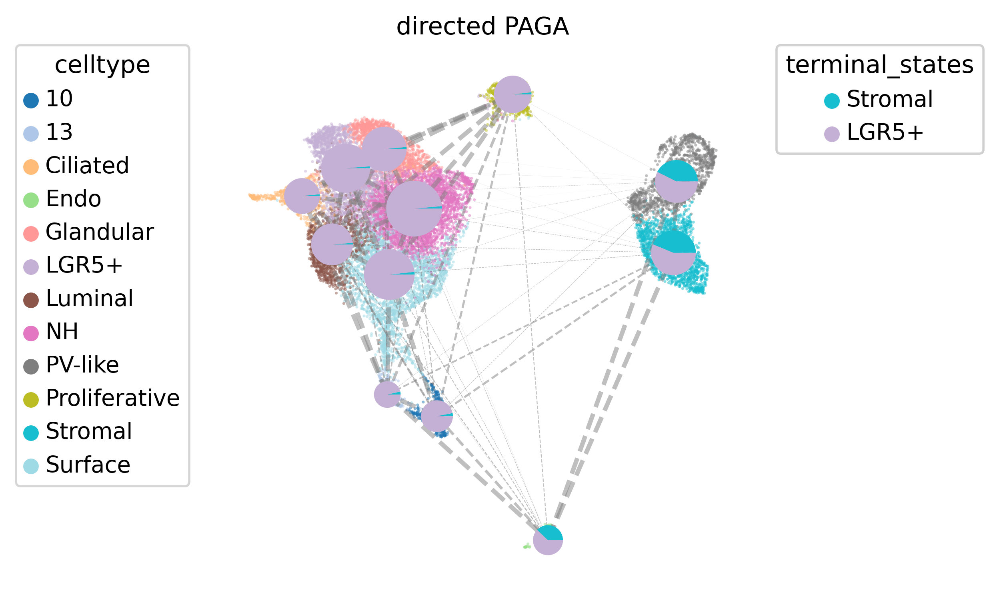

In [46]:
cr.pl.cluster_fates(
    adata,
    mode="paga_pie",
    cluster_key="celltype",
    basis="umap",
    legend_kwargs={"loc": "top right out"},
    legend_loc="top left out",
    node_size_scale=2,
    edge_width_scale=1,
    max_edge_width=2,
    title="directed PAGA",
)

In [47]:
# Compute lineage drivers
cr.tl.lineage_drivers(adata)

/tmp/ipykernel_197890/4283801959.py:2: DeprecationWarning: `cellrank.tl.lineage_drivers` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineage_drivers(adata)


,Stromal_corr,Stromal_pval,Stromal_qval,Stromal_ci_low,Stromal_ci_high,LGR5+_corr,LGR5+_pval,LGR5+_qval,LGR5+_ci_low,LGR5+_ci_high
CDH13,0.729745,0.0,NaN,0.722751,0.736590,-0.729745,0.0,NaN,-0.736590,-0.722751
ZEB1,0.728572,0.0,NaN,0.721553,0.735442,-0.728572,0.0,NaN,-0.735442,-0.721552
COL6A2,0.726664,0.0,NaN,0.719603,0.733575,-0.726664,0.0,NaN,-0.733575,-0.719603
SGIP1,0.718022,0.0,NaN,0.710775,0.725116,-0.718021,0.0,NaN,-0.725116,-0.710774
COL6A1,0.713631,0.0,NaN,0.706290,0.720818,-0.713631,0.0,NaN,-0.720818,-0.706290
...,...,...,...,...,...,...,...,...,...,...
PAX8,-0.434431,0.0,NaN,-0.446362,-0.422346,0.434431,0.0,NaN,0.422346,0.446362
SORBS2,-0.453534,0.0,NaN,-0.465212,-0.441698,0.453534,0.0,NaN,0.441698,0.465211
ASB17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MTRNR2L1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


/opt/conda/envs/CellRank/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


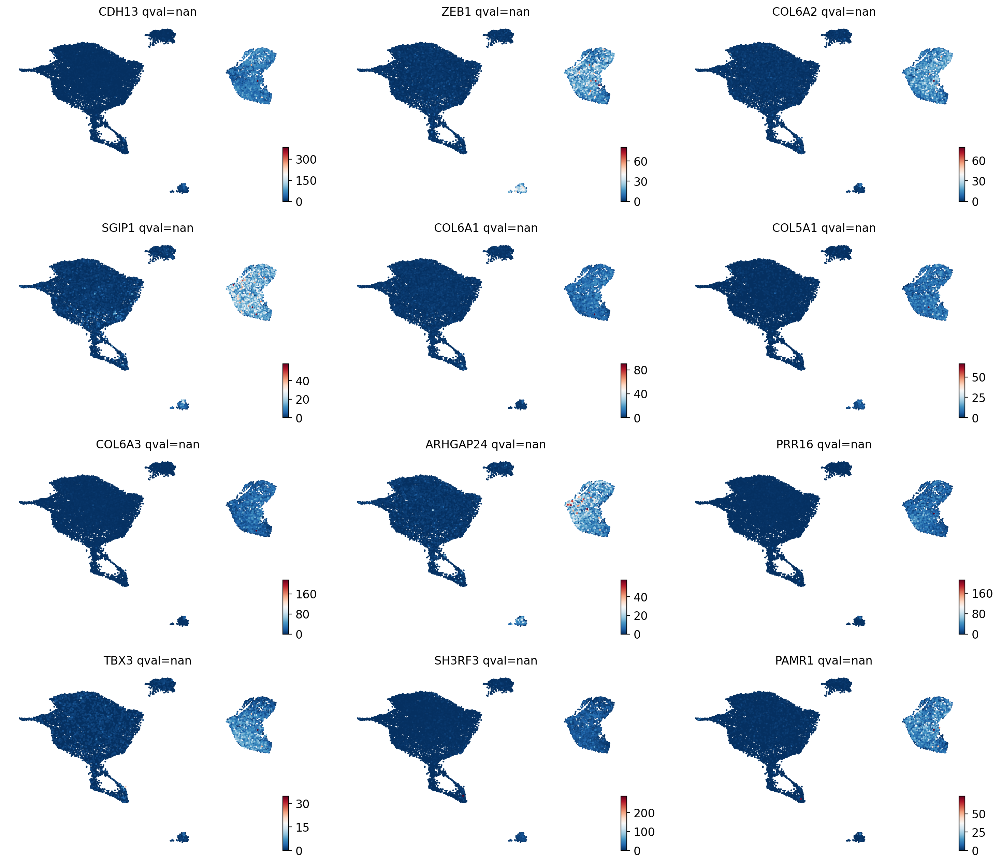

In [293]:
cr.pl.lineage_drivers(adata, lineage="Glandular", n_genes=12, ncols=3, use_raw = False)

In [71]:
drivers = cr.tl.lineage_drivers(adata, lineages="Stromal")
drivers

/tmp/ipykernel_197890/359100014.py:1: DeprecationWarning: `cellrank.tl.lineage_drivers` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  drivers = cr.tl.lineage_drivers(adata, lineages="Stromal")


,Stromal_corr,Stromal_pval,Stromal_qval,Stromal_ci_low,Stromal_ci_high
CDH13,0.729745,0.0,NaN,0.722751,0.736590
ZEB1,0.728572,0.0,NaN,0.721553,0.735442
COL6A2,0.726664,0.0,NaN,0.719603,0.733575
SGIP1,0.718022,0.0,NaN,0.710775,0.725116
COL6A1,0.713631,0.0,NaN,0.706290,0.720818
...,...,...,...,...,...
PAX8,-0.434431,0.0,NaN,-0.446362,-0.422346
SORBS2,-0.453534,0.0,NaN,-0.465212,-0.441698
ASB17,NaN,NaN,NaN,NaN,NaN
MTRNR2L1,NaN,NaN,NaN,NaN,NaN


/opt/conda/envs/CellRank/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


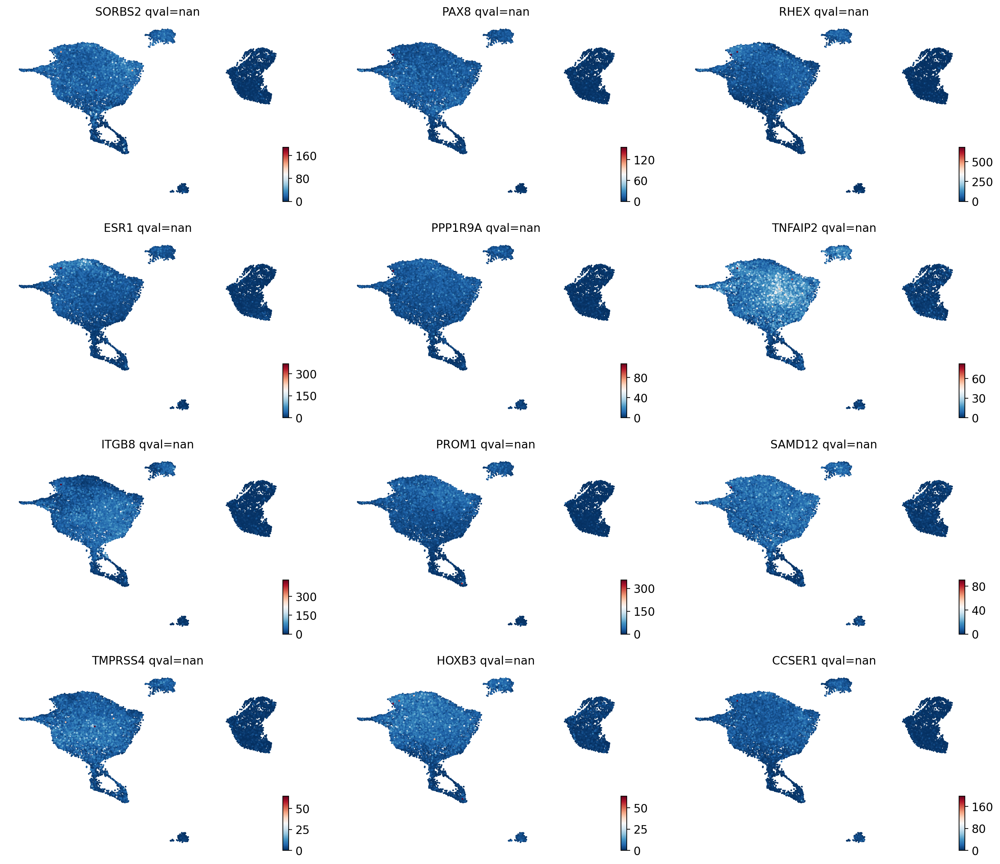

In [70]:
# We can identify specific gene drivers based on Velocity values
cr.pl.lineage_drivers(adata, lineage="LGR5+", n_genes=12, ncols=3, use_raw = False)

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.99822044 0.99185604 0.99026006 0.98841494 0.9872008
     0.9856831  0.97944933 0.9782508  0.9761036  0.97216576 0.9708823
     0.96738756 0.9657972  0.96514636]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


/opt/conda/envs/CellRank/lib/python3.9/site-packages/scvelo/plotting/utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


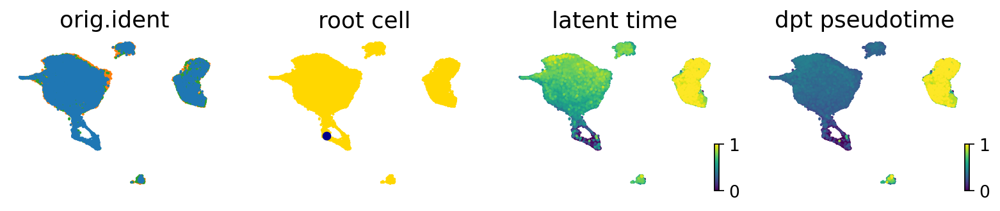

In [73]:
# compue DPT, starting from CellRank defined root cell
root_idx = np.where(adata.obs["initial_states"] == "13")[0][0]
adata.uns["iroot"] = root_idx
sc.tl.dpt(adata)

scv.pl.scatter(
    adata,
    color=["orig.ident", root_idx, "latent_time", "dpt_pseudotime"],
    fontsize=16,
    cmap="viridis",
    perc=[2, 98],
    colorbar=True,
    rescale_color=[0, 1],
    title=["orig.ident", "root cell", "latent time", "dpt pseudotime"]
)

  0%|          | 0/14 [00:00<?, ?gene/s]

/home/nagai/singularity_envs/arima_endometrial/.local/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:356: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/home/nagai/singularity_envs/arima_endometrial/.local/lib/python3.9/site-packages/rpy2/robjects/numpy2ri.py:226: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/home/nagai/singularity_envs/arima_endometrial/.local/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:356: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/h

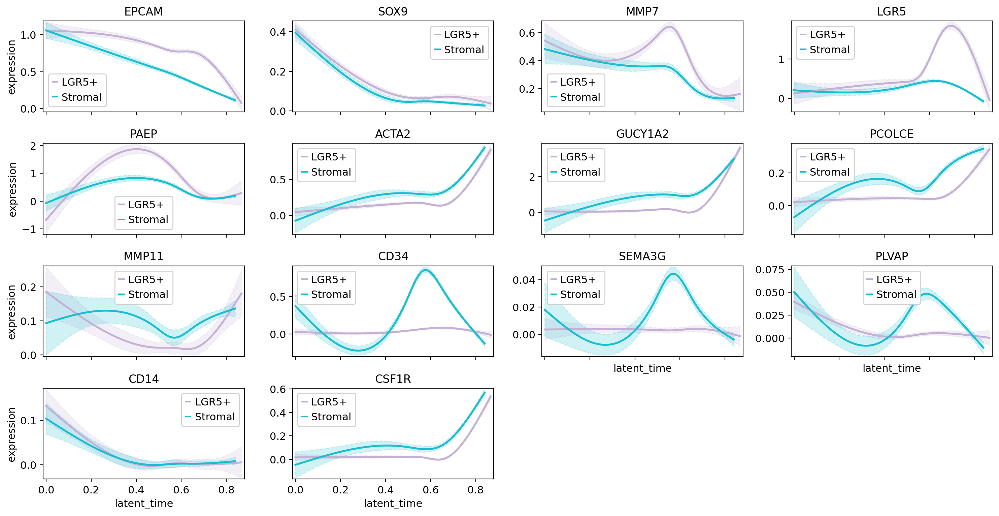

In [76]:
model = cr.ul.models.GAMR(adata)
cr.pl.gene_trends(
    adata, 
    model=model,
    data_key="X",
    genes= markers,
    ncols=4,
    time_key="latent_time",
    same_plot=True,
    hide_cells=True,
    figsize=(15, 8),
    n_test_points=800,
    save="gene_trends_2.pdf"
)